* 코드 돌릴 때 확인해야 할 것

1. 학습한 모델을 저장하는 경로 바꿔주기
2. 예시 사진 경로는 알아서 입력하기
3. 필요한 파일 : 쇼핑몰 파일(공유 드라이브), 쇼핑몰 분류_revised(공유 드라이브), 예시 사진

## 0. Import Module

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from __future__ import print_function, division

import torch
import torch.utils as utils
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from PIL import Image

from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import pandas as pd
import torchvision
from tqdm import tqdm
from torchvision import datasets, models, transforms
import torchvision.transforms as T
import matplotlib.pyplot as plt
import time
import os
import copy

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

import heapq
import math
import cv2

## 1. MODEL 학습(baseline) - 돌리지 않아도 됨

In [ ]:
!wget https://kr.object.ncloudstorage.com/aihub-competition/dataset/K-Fashion_Train.zip
!unzip -qq K-Fashion_Train.zip

--2023-08-21 07:00:59--  https://kr.object.ncloudstorage.com/aihub-competition/dataset/K-Fashion_Train.zip
Resolving kr.object.ncloudstorage.com (kr.object.ncloudstorage.com)... 61.97.180.102
Connecting to kr.object.ncloudstorage.com (kr.object.ncloudstorage.com)|61.97.180.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 432747336 (413M) [application/zip]
Saving to: ‘K-Fashion_Train.zip’

K-Fashion_Train.zip 100%[===================>] 412.70M  24.7MB/s    in 17s     

2023-08-21 07:01:18 (23.7 MB/s) - ‘K-Fashion_Train.zip’ saved [432747336/432747336]



In [ ]:
data_dir = '/content/Train/'
data_transform = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

image_dataset =  datasets.ImageFolder(data_dir, data_transform)

train_split = 0.9
split_size = int(len(image_dataset) * train_split)
batch_size = 64
num_workers=16

train_set, valid_set = torch.utils.data.random_split(image_dataset, [split_size, len(image_dataset) - split_size])
tr_loader = utils.data.DataLoader(dataset=train_set,
                            batch_size=batch_size,
                            shuffle=True,
                            num_workers=num_workers)
val_loader = utils.data.DataLoader(dataset=valid_set,
                              batch_size=batch_size,
                              shuffle=False,
                              num_workers=num_workers)
dataloaders = {'train': tr_loader, 'val':val_loader}
dataset_sizes = {}
dataset_sizes['train'] = split_size
dataset_sizes['val'] = len(image_dataset) -split_size
class_names = image_dataset.classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=2):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    model.load_state_dict(best_model_wts)
    return model

In [ ]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features

model_ft.fc = nn.Linear(num_ftrs, len(image_dataset.classes))
model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:03<00:00, 12.4MB/s]


In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=10)

Epoch 0/9
----------
train Loss: 3.0820 Acc: 0.0926
val Loss: 2.9281 Acc: 0.1522

Epoch 1/9
----------
train Loss: 2.7912 Acc: 0.1775
val Loss: 2.6849 Acc: 0.2159

Epoch 2/9
----------
train Loss: 2.6214 Acc: 0.2225
val Loss: 2.6538 Acc: 0.2203

Epoch 3/9
----------
train Loss: 2.5026 Acc: 0.2551
val Loss: 2.5780 Acc: 0.2217

Epoch 4/9
----------
train Loss: 2.4239 Acc: 0.2767
val Loss: 2.4697 Acc: 0.2739

Epoch 5/9
----------
train Loss: 2.3455 Acc: 0.3019
val Loss: 2.4813 Acc: 0.2565

Epoch 6/9
----------
train Loss: 2.2983 Acc: 0.3126
val Loss: 2.4828 Acc: 0.2652

Epoch 7/9
----------
train Loss: 2.2125 Acc: 0.3440
val Loss: 2.4306 Acc: 0.2841

Epoch 8/9
----------
train Loss: 2.2112 Acc: 0.3424
val Loss: 2.4600 Acc: 0.2551

Epoch 9/9
----------
train Loss: 2.1832 Acc: 0.3546
val Loss: 2.4259 Acc: 0.2739

Training complete in 10m 20s
Best val Acc: 0.284058


In [ ]:
# 모델 저장하는 경로 및 모델명 입력
PATH = '/content/drive/MyDrive/추천시스템/'
torch.save(model_ft, PATH + 'baseline_model.pt')

In [ ]:
from torchvision.transforms import ToTensor
tf_toTensor = ToTensor()

In [ ]:
# 스타일 분류 모델 사용 함수
def style_result(INPUT, MODEL_PATH, device, class_names):

    img = Image.open(INPUT)
    img = img.resize((224, 224))
    tensor_img = tf_toTensor(img)
    tensor_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(tensor_img)
    tensor_img = torch.reshape(tensor_img, [-1, 3, 224, 224])

    model = torch.load(MODEL_PATH, map_location=device)
    model_pr = model.eval()

    pred = model_pr(tensor_img).argmax()
    pred_style = class_names[pred]

    return {'class':pred, 'style':pred_style}

In [ ]:
# 23가지 class 순서 참고
pd.DataFrame({'style':class_names})

,style
0,레트로
1,로맨틱
2,리조트
3,매니시
4,모던
5,밀리터리
6,섹시
7,소피스트케이티드
8,스트리트
9,스포티


In [ ]:
# input 사진 경로 및 모델 경로 입력
INPUT = '/content/drive/MyDrive/추천시스템/예시 사진.jpg'
MODEL_PATH = '/content/drive/MyDrive/추천시스템/baseline_model.pt'

style_result(INPUT, MODEL_PATH, 'cpu', class_names)

{'class': tensor(22), 'style': '힙합'}

## 2. MODEL 학습(modified)

In [ ]:
# cropped image 경로 입력
data_dir = '/content/drive/MyDrive/K-Fashion/'
data_transform = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

image_dataset =  datasets.ImageFolder(data_dir, data_transform)

train_split = 0.7
split_size = int(len(image_dataset) * train_split)
batch_size = 16
num_workers= 6

train_set, valid_set = torch.utils.data.random_split(image_dataset, [split_size, len(image_dataset) - split_size])
tr_loader = utils.data.DataLoader(dataset=train_set,
                            batch_size=batch_size,
                            shuffle=True,
                            num_workers=num_workers)
val_loader = utils.data.DataLoader(dataset=valid_set,
                              batch_size=batch_size,
                              shuffle=False,
                              num_workers=num_workers)
dataloaders = {'train': tr_loader, 'val':val_loader}
dataset_sizes = {}
dataset_sizes['train'] = split_size
dataset_sizes['val'] = len(image_dataset) -split_size
class_names = image_dataset.classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=2):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    model.load_state_dict(best_model_wts)
    return model

In [ ]:
model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features

model_ft.fc = nn.Linear(num_ftrs, len(image_dataset.classes))
model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 66.0MB/s]


In [ ]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=20)

Epoch 0/19
----------
train Loss: 2.6949 Acc: 0.2008
val Loss: 2.7158 Acc: 0.2034

Epoch 1/19
----------
train Loss: 2.5713 Acc: 0.2371
val Loss: 2.6216 Acc: 0.2217

Epoch 2/19
----------
train Loss: 2.4380 Acc: 0.2760
val Loss: 2.5712 Acc: 0.2512

Epoch 3/19
----------
train Loss: 2.3653 Acc: 0.2996
val Loss: 2.5402 Acc: 0.2580

Epoch 4/19
----------
train Loss: 2.3261 Acc: 0.3012
val Loss: 2.6054 Acc: 0.2483

Epoch 5/19
----------
train Loss: 2.2262 Acc: 0.3333
val Loss: 2.5713 Acc: 0.2696

Epoch 6/19
----------
train Loss: 2.1566 Acc: 0.3478
val Loss: 2.6032 Acc: 0.2671

Epoch 7/19
----------
train Loss: 1.9345 Acc: 0.4197
val Loss: 2.4882 Acc: 0.2894

Epoch 8/19
----------
train Loss: 1.8621 Acc: 0.4385
val Loss: 2.4747 Acc: 0.2889

Epoch 9/19
----------
train Loss: 1.8287 Acc: 0.4580
val Loss: 2.4840 Acc: 0.2899

Epoch 10/19
----------
train Loss: 1.8045 Acc: 0.4629
val Loss: 2.4761 Acc: 0.2995

Epoch 11/19
----------
train Loss: 1.7956 Acc: 0.4669
val Loss: 2.5009 Acc: 0.2778

Ep

In [ ]:
# 모델 저장하는 경로 및 모델명 입력
PATH = '/content/drive/MyDrive/'
torch.save(model_ft, PATH + 'modified_model.pt')

In [ ]:
from torchvision.transforms import ToTensor
tf_toTensor = ToTensor()

In [ ]:
# 스타일 분류 모델 사용 함수
def style_result(INPUT, MODEL_PATH, device, class_names):

    img = Image.open(INPUT)
    img = img.resize((224, 224))
    tensor_img = tf_toTensor(img)
    tensor_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(tensor_img)
    tensor_img = torch.reshape(tensor_img, [-1, 3, 224, 224])

    model = torch.load(MODEL_PATH, map_location=device)
    model_pr = model.eval()

    pred = model_pr(tensor_img).argmax()
    pred_style = class_names[pred]

    return {'class':pred, 'style':pred_style}

In [ ]:
# input 사진 경로 및 모델 경로 입력
INPUT = '/content/drive/MyDrive/image_8.jpg'
MODEL_PATH = '/content/drive/MyDrive/modified_model.pt'

style_result(INPUT, MODEL_PATH, 'cpu', class_names)

{'class': tensor(22), 'style': '힙합'}

## 3. 추천시스템 구현

In [ ]:
# 두 개의 사진에 대하여 유사도를 도출하는 함수

## 딥러닝 version
def calculate_deep_similarity(image_path1, image_path2):
    model = VGG16(weights='imagenet', include_top=False)

    img1 = image.load_img(image_path1, target_size=(224, 224))
    img2 = image.load_img(image_path2, target_size=(224, 224))

    img1_array = preprocess_input(np.expand_dims(image.img_to_array(img1), axis=0))
    img2_array = preprocess_input(np.expand_dims(image.img_to_array(img2), axis=0))

    features1 = model.predict(img1_array)
    features2 = model.predict(img2_array)

    similarity = np.dot(features1.flatten(), features2.flatten()) / (np.linalg.norm(features1) * np.linalg.norm(features2))

    return similarity

## pixel version
def resize_image(image_path, target_size):
    img = Image.open(image_path)
    img = img.resize(target_size, Image.ANTIALIAS)
    return img

def calculate_pixel_similarity(image_path1, image_path2, target_size=(224,224)):
    img1 = resize_image(image_path1, target_size)
    img2 = resize_image(image_path2, target_size)

    pixels1 = np.array(img1)
    pixels2 = np.array(img2)

    pixels1 = pixels1 / 255.0
    pixels2 = pixels2 / 255.0

    pixel_diff = np.abs(pixels1 - pixels2)

    similarity = 1.0 - np.mean(pixel_diff)

    return similarity

In [ ]:
# score 상위 n개 도출

def top_n_indices(arr, n):

    top_indices = []

    heap = [(-value, index) for index, value in enumerate(arr)]
    heapq.heapify(heap)

    for _ in range(n):
        neg_value, index = heapq.heappop(heap)
        top_indices.append(index)

    return top_indices

In [ ]:
# 미리 학습된 Mask R-CNN 모델 로드 -> crop할 때 사용
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# 모델을 평가 모드로 설정
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
# bounding box가 여러 개가 나올 수 있으므로, 확률 값이 가장 큰 bounding box의 index 값을 추출하는 함수 정의
def find_max_index(tensor):
    max_value, max_index = torch.max(tensor, dim=0)
    return max_index.item()

# crop하고 정사각형으로 만드는 함수 -
def crop_and_color(original_path, middle_path, output_path):
  img = Image.open(original_path)
  transform = T.Compose([T.ToTensor()])
  input_image = transform(img)
  input_image = input_image.unsqueeze(0)

  with torch.no_grad():
    prediction = model(input_image)

  boxes = prediction[0]['boxes'] # bounding box 좌표
  scores = prediction[0]['scores'] # 객체의 확률 값들

  bounding_box = boxes[find_max_index(scores)]

  # 텐서에서 바운딩 박스 좌표 얻기
  x_min, y_min, x_max, y_max = bounding_box

  # 텐서를 정수로 반환(인덱싱 하려고)
  x_min = math.floor(x_min.item())
  y_min = math.floor(y_min.item())
  x_max = math.floor(x_max.item())
  y_max = math.floor(y_max.item())

  # 이미지 읽기
  image = cv2.imread(original_path)

  # 바운딩 박스 좌표를 이용하여 이미지 crop
  cropped_image = image[y_min:y_max, x_min:x_max]

  # crop 이미지 저장
  cv2.imwrite(middle_path, cropped_image)

  # 정사각형으로 만들기
  image = Image.open(middle_path)

  img_size = image.size # 이미지의 크기 측정
  x = img_size[0] # 넓이값
  y = img_size[1] # 높이값

  if x != y:
    size = max(x, y)
    resized_img = Image.new(mode = 'RGB', size = (size, size), color = (255, 255, 255))
    offset = (round((abs(x - size)) / 2), round((abs(y - size)) / 2))
    resized_img.paste(image, offset)

    resized_img.save(output_path,'PNG')

In [ ]:
# 희귀한 스타일의 경우 다른 스타일로 대체하는 함수
def change_style(style_number):
  modified_style = [0,19,19,7,6,22,6,7,8,9,10,11,7,16,0,6,16,7,22,19,10,11,22]
  return modified_style[style_number]

# style 번호를 입력하면 그에 맞는 쇼핑몰을 반환하는 함수
def return_table(style_number):
  return shopping_mall_list[shopping_mall_list['style'] == style_number]

In [ ]:
# 최종 함수

shopping_mall_list = pd.read_excel('/content/drive/MyDrive/쇼핑몰 분류_revised.xlsx') # shopping_mall별 분위기 데이터
crawling_data_path = '/content/drive/MyDrive/쇼핑몰/' # 인스타 쇼핑몰 크롤링 데이터

def similar_style(image_path, model_path, similarity_func):

  image_category = style_result(image_path, model_path,'cpu',class_names)['class'].numpy().item()
  sorted_same_style_mall = shopping_mall_list[shopping_mall_list['style'] == image_category].sort_values(by='proportion', ascending=False).head(3)

  if sorted_same_style_mall.shape[0] <= 2:
    sorted_same_style_mall = pd.concat([return_table(image_category), return_table(change_style(image_category))]).sort_values(by='proportion', ascending=False).head(3)

  image_list = []; score_list = []; top_score = []; output = []

  for i in range(len(sorted_same_style_mall['mall'].to_list())):
    target_mall = str(sorted_same_style_mall['mall'].to_list()[i])
    style_name = shopping_mall_list[shopping_mall_list['mall'] == target_mall]['style_name'].iloc[0]

    folder_path = crawling_data_path + style_name + '/' + str(sorted_same_style_mall['mall'].to_list()[i])
    image_lists = []; score = []
    for filename in os.listdir(folder_path):
      file_path = os.path.join(folder_path, filename)

      if os.path.isfile(file_path) and filename.lower().endswith(('.jpg')):
          image_lists.append(file_path)

      similarity_score = similarity_func(image_path, file_path)
      score.append(similarity_score)
    image_list.append(image_lists); score_list.append(score)
    top_score.append(top_n_indices(score_list[i],3))
    output.append([image_list[i][index] for index in top_score[i]])

  for number, i in enumerate(output):
    print(); print(f"{number+1}번째 쇼핑몰: {sorted_same_style_mall['mall'].to_list()[number]}"); print()
    for j in i:
      image_ = Image.open(j)
      display(image_); print()

  style = {'style' : class_names[image_category]}
  shopping_malls = pd.DataFrame({'shopping_mall' : sorted_same_style_mall['mall'].to_list(), 'instagram_ID' : sorted_same_style_mall['instagram_ID'].to_list()})

  return style, shopping_malls

## 4. 최종 결과

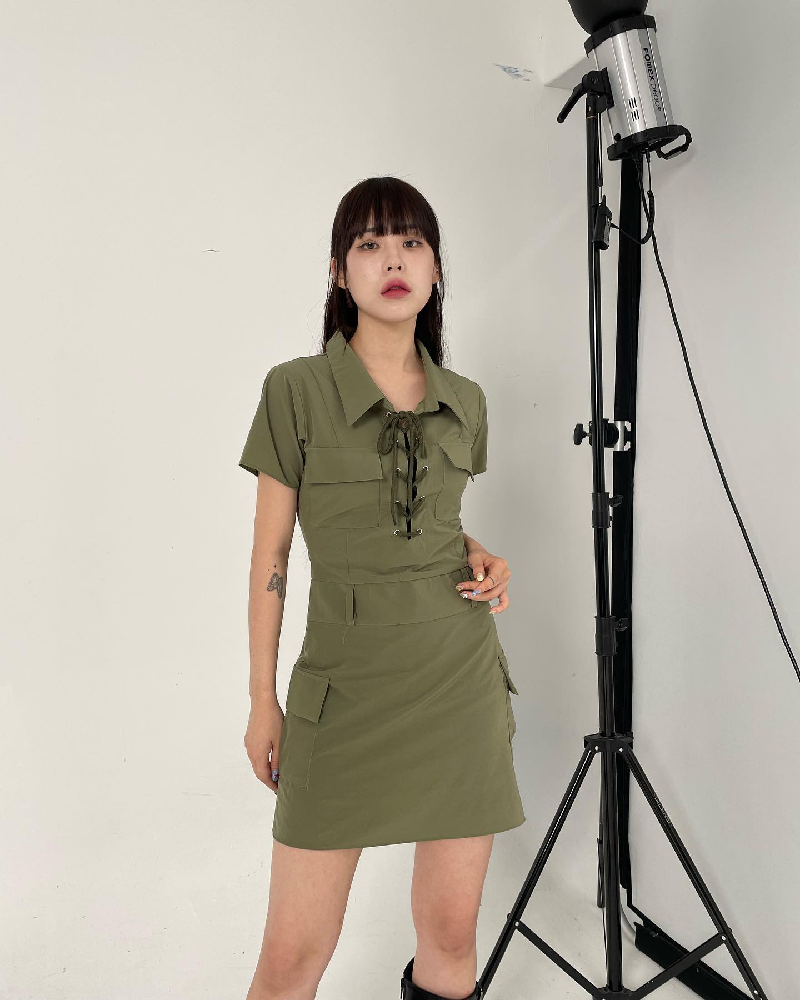

In [ ]:
# 예시 사진
Image.open('/content/drive/MyDrive/image_8.jpg')

1/1 [==============================] - 0s 19ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 18ms/step

1번째 쇼핑몰: 큐니걸스



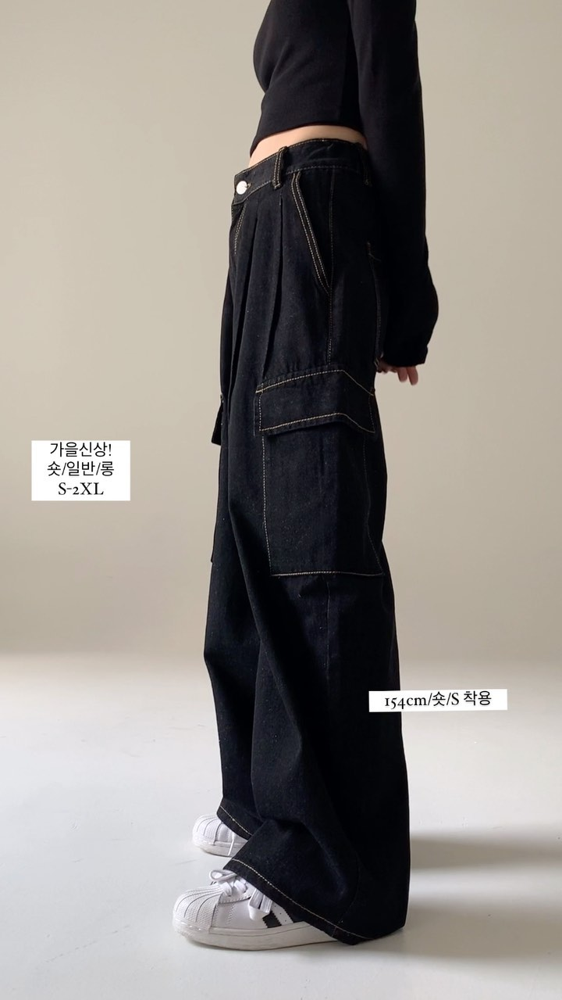

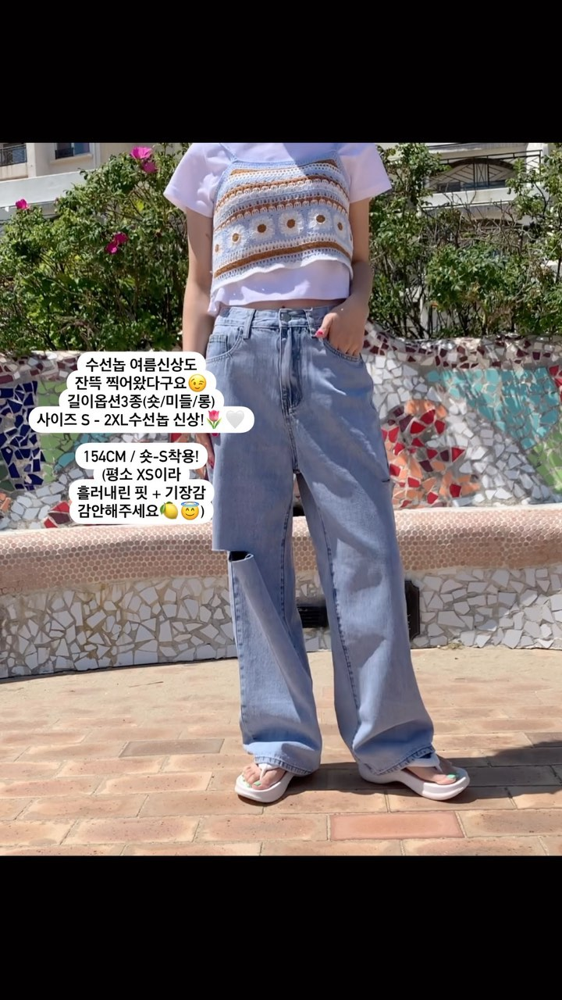

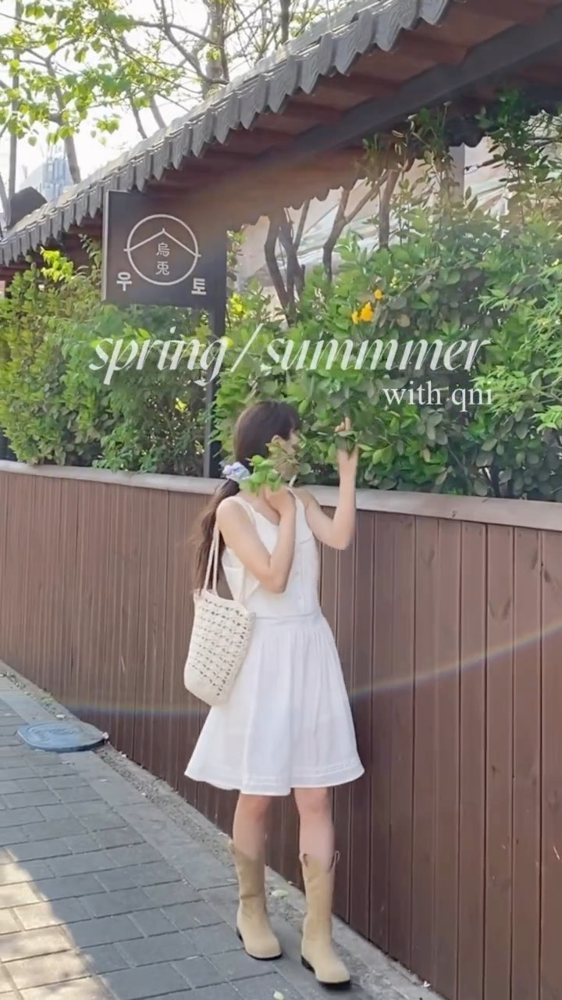



2번째 쇼핑몰: 키무엔드



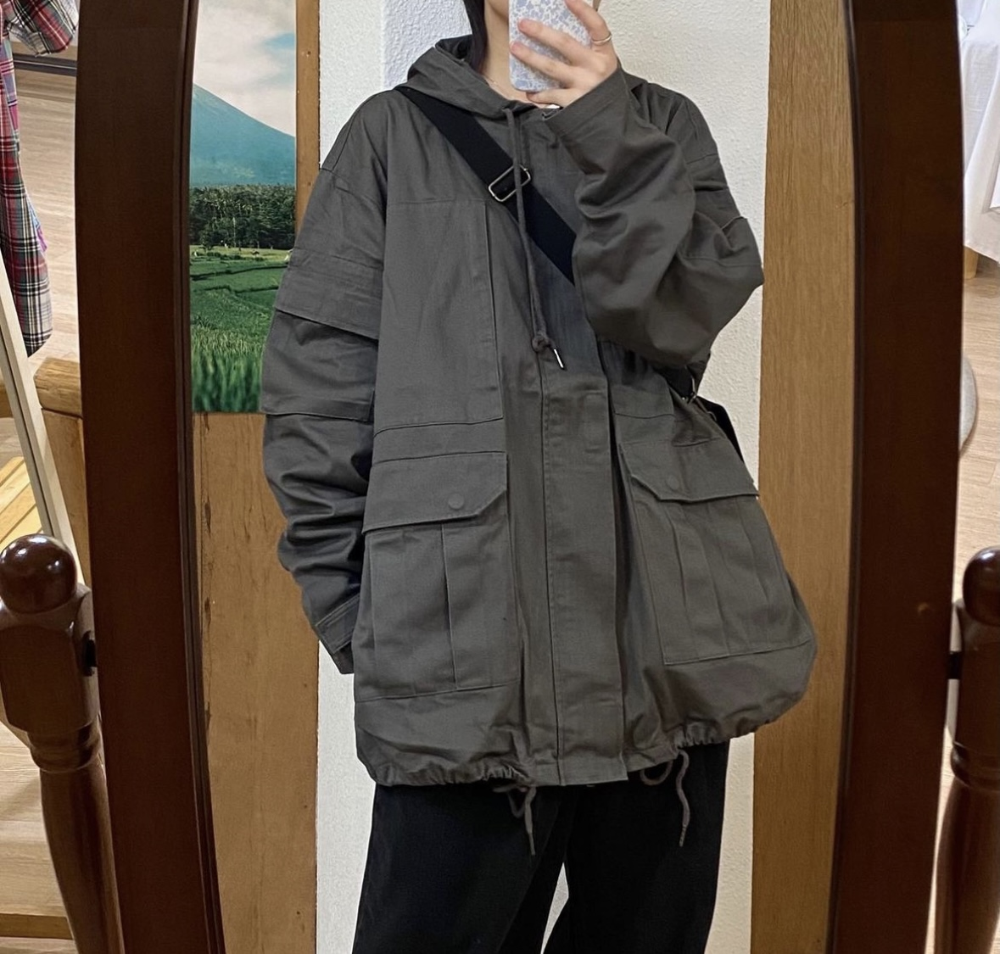

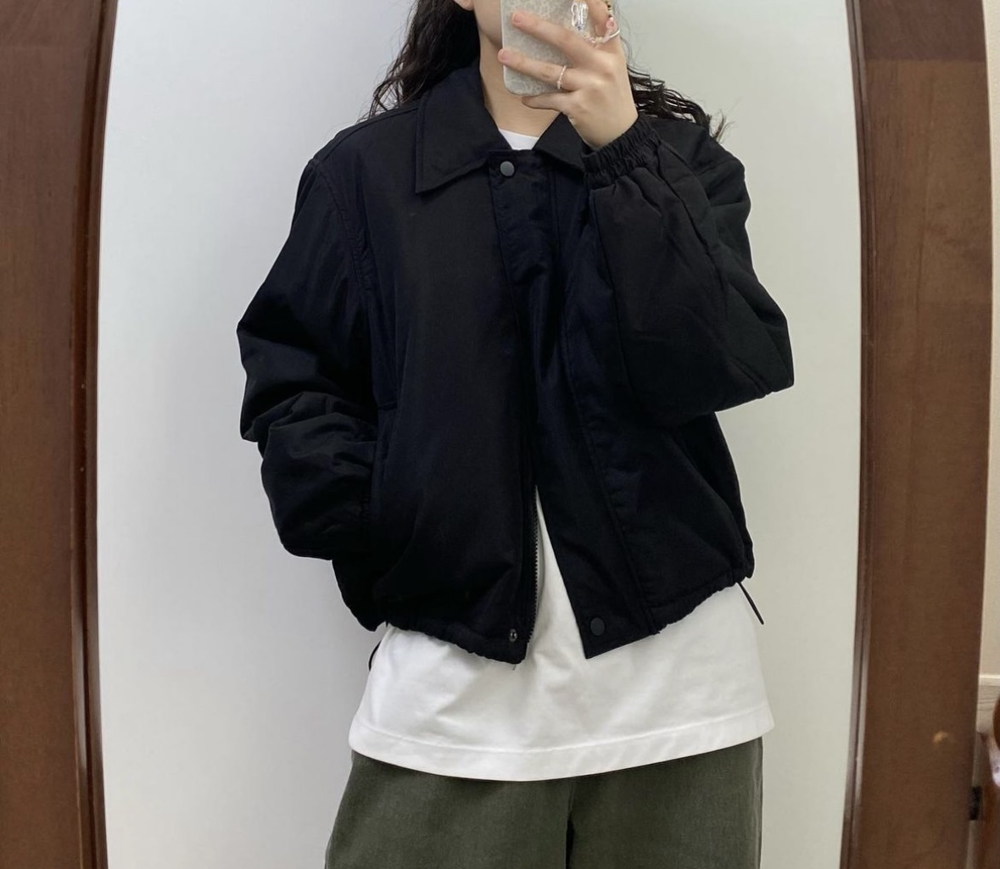

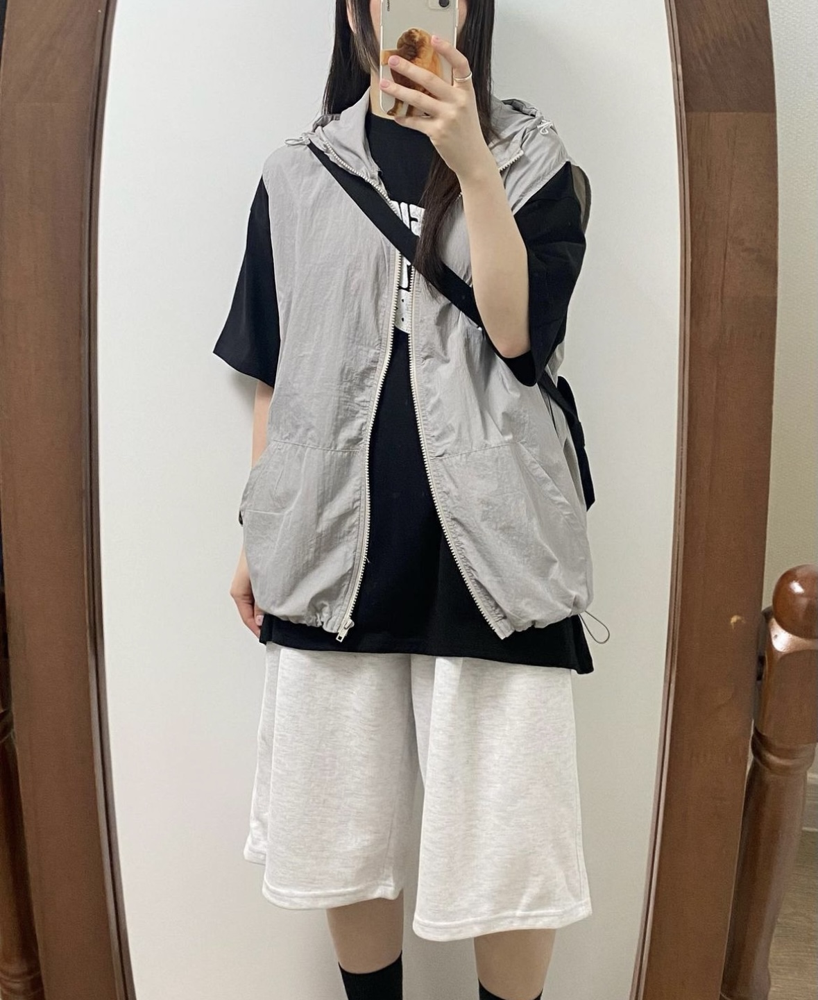



3번째 쇼핑몰: 르뚜앙



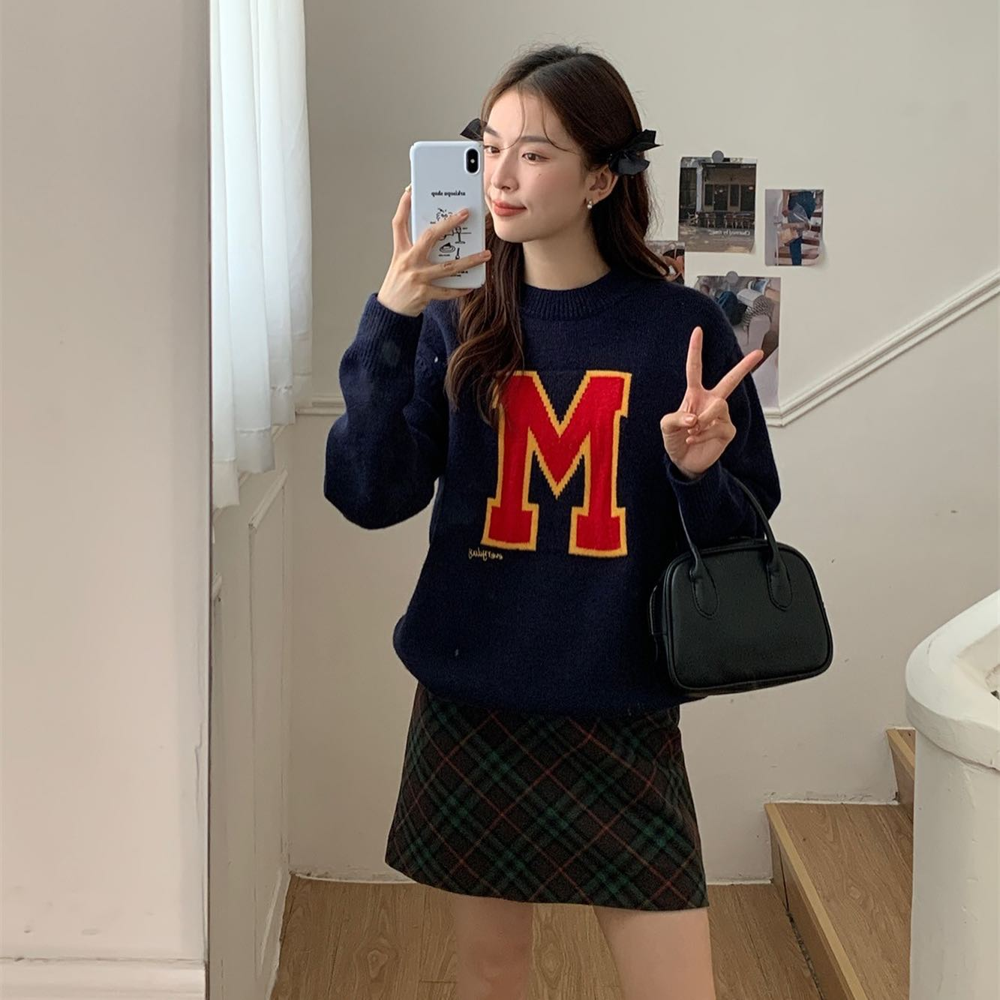

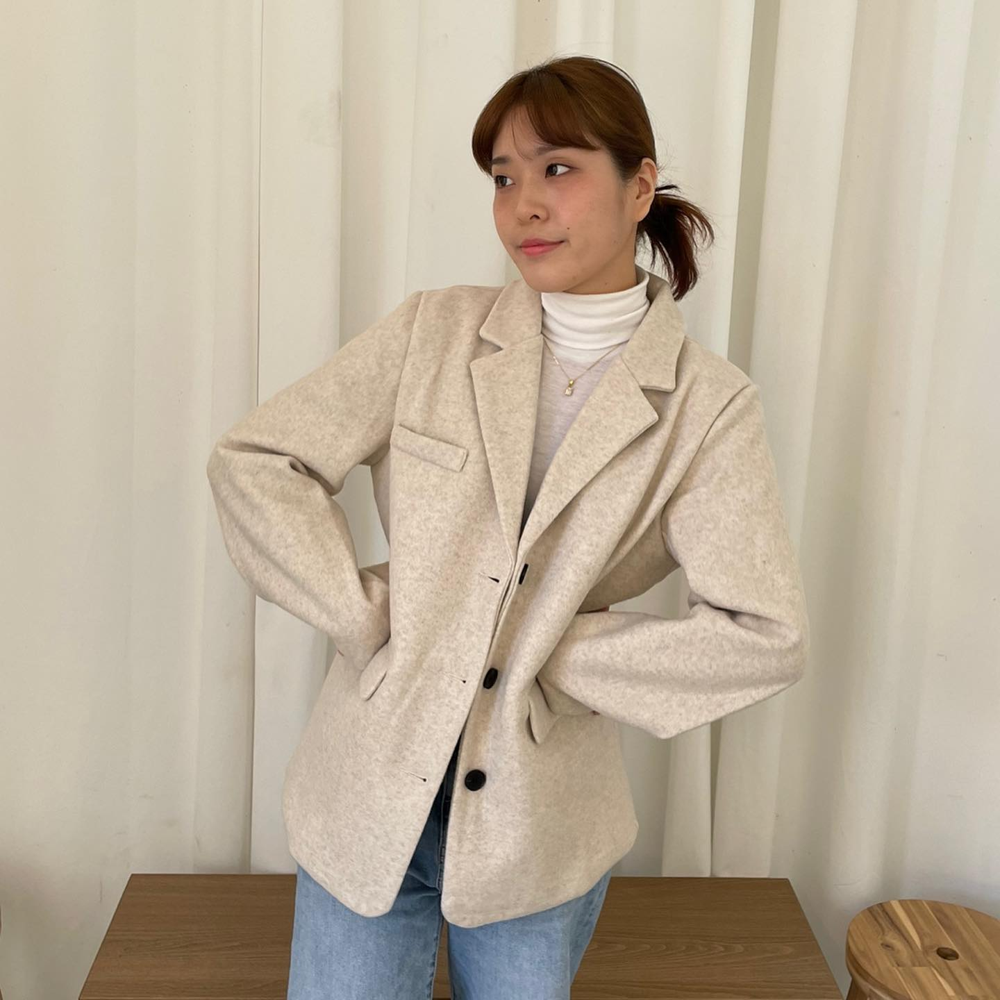

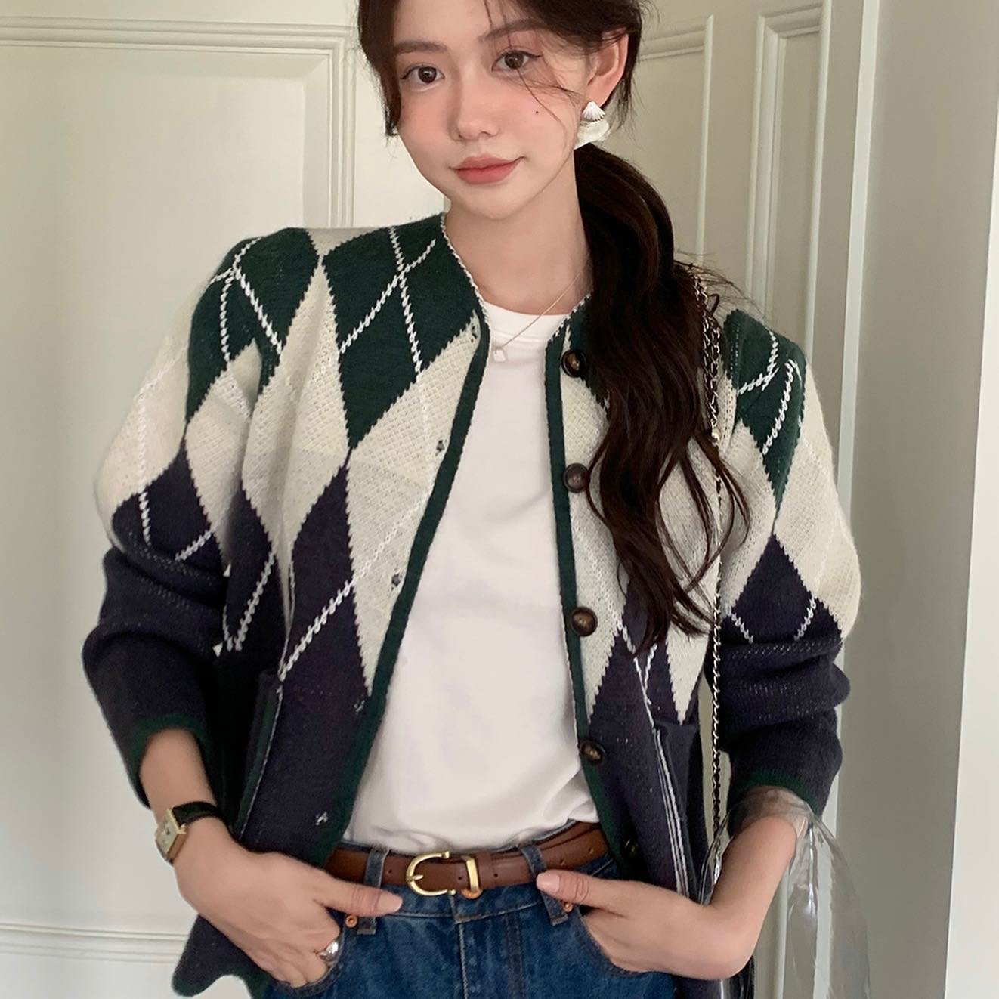


{'style': '밀리터리'}


,shopping_mall,instagram_ID
0,큐니걸스,qnigirls_official
1,키무엔드,kimuend
2,르뚜앙,hrhwilda


In [ ]:
input_path = '/content/drive/MyDrive/image_8.jpg' # 원본 사진 경로
middle_path = '/content/drive/MyDrive/example_1_cropped.jpg' # crop 이미지 저장 경로
output_path = '/content/drive/MyDrive/example_1_cropped_color.jpg' # 최종 전처리 완료 이미지 경로

MODEL_PATH = '/content/drive/MyDrive/modified_model.pt'

# crop후 정사각형으로 만들기
crop_and_color(input_path, middle_path, output_path)

# 최종 결과물
style, shopping_malls = similar_style(output_path, MODEL_PATH, calculate_deep_similarity)
print(style); shopping_malls

## 번외) 비슷한 스타일 매칭